# Creating figures for the paper

### WARNING

Before the article submission we changed the naming of the methods to make it easier to understand our experiments and aim.
Therefore, in this notebook, we are changing the experiment and method names according to the following map:

In [328]:
naming = {
    'baseline': 'BENCHMARK',
    'gauss': 'BASELINE',
    'styled': 'FAKET',
    'shrec': 'SHREC',
    'noiseless': 'NOISELESS',
}

In [1]:
climb = ''

In [389]:
import os
import json
import numpy as np
import pandas as pd
import seaborn as sns
from itertools import product
from os.path import join as pj
import matplotlib.pyplot as plt
from faket.data import load_mrc
from matplotlib.patches import Rectangle
from faket.data import standardize

In [3]:
plt.rcParams['font.family'] = 'serif'
sns.set(font="serif")

In [4]:
data_folder = pj(climb, 'data/shrec2021_extended_dataset')

### Defining helper functions

In [402]:
def plot_tilt(projections, tilt=30, title='', clim=None, fig=True):
    if fig:
        plt.figure(dpi=200)
        plt.title(title)
    plt.imshow(projections[tilt,:,:], cmap='viridis')
    if clim is not None:
        plt.clim(*clim)
    plt.colorbar()
    plt.tight_layout()          
    
def particle_counts(data_folder):
    counts = []
    for i in range(10):
        fname = pj(data_folder, f'model_{i}', 'particle_locations.txt')
        df = pd.read_csv(fname, sep=' ', usecols=[0], names=['particle'])
        counts.append(df['particle'].value_counts())
        # counts.set_index(0)
        # print(counts)
    df = pd.concat(counts, axis=1)
    df.columns = [f'model_{i}' for i in range(10)]
    sorted_by_size = [  # Sorted according to size
            '1S3X', '3QM1', '3GL1', '3H84', '2CG9',  # small
            '3D2F', '1U6G', '3CF3', '1BXN', '1QVR',  # medium
            '4CR2', '5MRC', # large
            'fiducial'] 
    return df.reindex(sorted_by_size)

def plot_method_comparison(df, task='localization', ylim_lo=0.0, ylim_hi=1.0, yticks=10, xticks=10, palette=None, figsize=(7,6), dpi=200, style=4):
    """
    Expects a pandas dataframe with experiment results in the following format:
    -----------------------------------------------------------------------------
    IDX, TEST_TOMO, METHOD,   SEED,  EPOCH, F1 SCORE, F1 MACRO SCORE, report_path
    -----------------------------------------------------------------------------
    0,   baseline   baseline  seed1  1      0.61963   0.17095         data/rep...
    ...
    -----------------------------------------------------------------------------
    So one epoch result per row. 
    
    Plots the mean performance of each method's model at specified epoch numbers.
    Results are plotted with two confidence intervals based on the results from the
    specified seeds. The confidence intervals are computed using bootstrapping.
    """
    assert task in ['localization', 'classification']
    metric = 'F1 SCORE' if task == 'localization' else 'F1 MACRO SCORE'

    sns.set_style(['dark', 'white', 'whitegrid', 'darkgrid', 'ticks'][style])
    plt.rcParams['font.family'] = 'serif'
    
    fig = plt.figure(figsize=figsize, dpi=dpi)

    plot = sns.lineplot(x='EPOCH', y=metric, data=df, seed=0, hue="METHOD", marker='o', 
                        err_style='band', legend=False, ci=95, n_boot=500, markersize=0,
                        palette=palette, alpha=0)
    plot = sns.lineplot(x='EPOCH', y=metric, data=df, seed=0, hue="METHOD", marker='o', 
                        err_style='band', legend='brief', ci=68, n_boot=500, markersize=4,
                        palette=palette)

    
    import matplotlib.ticker as ticker
    plot.set_xticks(epochs)
    plt.xlim(0, df['EPOCH'].max())
    plot.xaxis.set_major_locator(ticker.MaxNLocator(nbins=xticks))
    plot.set_ylim(ylim_lo, ylim_hi)
    plot.yaxis.set_major_locator(ticker.MaxNLocator(nbins=yticks))
    
    n_methods = len(df['METHOD'].unique())
    channels = [(i + 1) * 2 - 1 for i in range(n_methods * 2)]
    channels_95 = channels[:n_methods]
    channels_68 = channels[n_methods:]
    # Setting alpha of the bands (ci=95) for each METHOD
    for ch in channels_95:
    # for ch in [1, 3, 5, 7]:
        plot.get_children()[ch].set_alpha(0.05)

    # Setting alpha of the bands (ci=68)  for each METHOD
    for ch in channels_68:
    # for ch in [9, 11, 13, 15]:
        plot.get_children()[ch].set_alpha(0.15)
    
    plt.show()
    return fig

def get_dataframe(folders, folder2method, test_tomo_indices, test_tomo_modalities, epochs, seeds):
    """
    Visits the `folders` at `path`, finds the `train_history.h5` and `evaluation.json` files 
    for each seed & epoch. Returns a data_frame containing the identifiers of each modela along
    with the information about its performance on validation and test sets.
    """
    df = pd.DataFrame()   
    
    for idx, modality in zip(test_tomo_indices, test_tomo_modalities):
        
        for folder in folders:
            template = folder2method[folder]['template']
            path = folder2method[folder]['path']
            
            for seed in seeds:
                val_f1 = get_val_f1(pj(path, folder, seed, 'logs/training/train_history.h5'), average='weighted')
                val_f1_all = val_f1['all']
                best_epoch_all = np.argmax(val_f1_all) + 1
                
                # Per size group (just informative)
                val_f1_small = val_f1['small']
                best_epoch_small = np.argmax(val_f1_small) + 1
                val_f1_medium = val_f1['medium']
                best_epoch_medium = np.argmax(val_f1_medium) + 1
                val_f1_large = val_f1['large']
                best_epoch_large = np.argmax(val_f1_large) + 1
                
                for epoch in epochs:
                    fp = pj(path, folder, seed, template.format(epoch, idx, modality), 'evaluation.json')
                    
                    with open(fp, 'r') as file:
                        evaluation = json.load(file)
                        f1 = evaluation['localization']['F1 score']
                        f1m = evaluation['classification']['overall']['F1 Macro']
                        per_class = evaluation['classification']['per_class']['F1']
                        del per_class['background']  # always 0
                    
                    df = pd.concat([df, pd.DataFrame({
                        'TEST_TOMO_IDX': [idx],
                        'TEST_TOMO_MODALITY': [modality],
                        'METHOD': [folder2method[folder]['method']],
                        'SEED': [seed],
                        'EPOCH': [epoch],
                        'VAL F1 SCORE': [val_f1_all[epoch - 1]],
                        'VAL BEST EPOCH': [True if epoch == best_epoch_all else False],
                        'VAL F1 SCORE (SMALL)': [val_f1_small[epoch - 1]],
                        'VAL BEST EPOCH (SMALL)': [True if epoch == best_epoch_small else False],
                        'VAL F1 SCORE (MEDIUM)': [val_f1_medium[epoch - 1]],
                        'VAL BEST EPOCH (MEDIUM)': [True if epoch == best_epoch_medium else False],
                        'VAL F1 SCORE (LARGE)': [val_f1_large[epoch - 1]],
                        'VAL BEST EPOCH (LARGE)': [True if epoch == best_epoch_large else False],
                        'F1 SCORE': [f1],
                        'F1 MACRO SCORE': [f1m],
                        'report_path': [fp],
                        **{k: [v] for k, v in per_class.items()}
                    })], axis=0, ignore_index=True)
    return df

def get_val_f1(train_hist_path, average='macro'):
    """
    WARNING: support provided only for model_8. Make sure the validation
    was done on that tomogram, or update the support dict in this function.
    
    Opens the h5 file from train_hist_path, reads the validation
    f1 score per epoch per validation step per class. Computes the mean
    per epoch and returns the array. 
            
    Particle to (class, size_group) for SHREC21
        'background': (0, 'rest'),
        '1S3X': (12, 'small'),
        '3QM1': (11, 'small'),
        '3GL1': (10, 'small'),
        '3H84': (9, 'small'),
        '2CG9': (8, 'small'),
        '3D2F': (7, 'medium'),
        '1U6G': (6, 'medium'),
        '3CF3': (5, 'medium'),
        '1BXN': (4, 'medium'),
        '1QVR': (3, 'medium'),
        '4CR2': (2, 'large'),
        '5MRC': (13, 'large'),
        '4V94': (1, 'rest'),
        'vesicle': (14, 'rest')
        'fiducial: (15, 'large'),
        
    Support of classes on validation tomogram model_8
        {'1S3X': 105,
         '3QM1': 115,
         '3GL1': 111,
         '3H84': 109,
         '2CG9': 109,
         '3D2F': 108,
         '1U6G': 139,
         '3CF3': 109,
         '1BXN': 115,
         '1QVR': 107,
         '4CR2': 113,
         '5MRC': 93,
         'fiducial': 10}
    """
    import h5py
    assert average in ['macro', 'weighted']
    
    size_groups = {  
        'rest': (0, 1, 14),
        'small': (8, 9, 10, 11, 12),
        'medium': (3, 4, 5, 6, 7),
        'large': (2, 13, 15)}
    
    support = {
         12: 105, 11: 115, 10: 111, 9: 109, 8: 109, 7: 108, 6: 139, 
         5: 109, 4: 115, 3: 107, 2: 113, 13: 93, 15: 10,
         0: 0, 1: 0, 14: 0}  # we do not care about background and excluded}

    with h5py.File(train_hist_path, "r") as f:
        
        # data shape is n_epochs x n_valid_steps x n_classes (? x 10 x 16)
        data = np.array(list(f['val_f1']))
        data = data.mean(axis=1)  # Average the n_valid_steps axis
        
        means_per_size_group = {}
        
        # F1 on validation per epoch per size group (mean of classes within size group)
        for group in ['all', 'small', 'medium', 'large']:
            indices = np.hstack(list(size_groups.values())) if group == 'all' else size_groups[group]
            weights = None if average == 'macro' else list(map(support.get, indices))
            means_per_size_group[group] = np.average(data[:, indices], weights=weights, axis=-1)
            
        return means_per_size_group
        

def stack_confusion_matrices(df, normalized=False, figsize=(10, 6), dpi=300, per_group=False):
    assert 'report_path' in df.columns

    # Assumed filename
    cmfname = 'confusion_matrix.csv'

    # Annotation and xticks templates
    atn = '{:.0f}%\n${}({:.0f}-{:.0f}){}$'
    ata = '{:.0f}\n${}({:.0f}-{:.0f}){}$'
    ytt = '{}\n${}n={}{}$'
    template = atn if normalized else ata

    # Aggregators for confmats, labels, and their counts
    cms, norm_cms, names, counts = [], [], None, None

    for report_path in df['report_path']:

        # Loading & processing csv data
        cmpath = pj(os.path.dirname(report_path), cmfname)
        cm = pd.read_csv(cmpath)
        names = cm.columns
        counts = cm.values.sum(axis=-1)
        cms.append(cm.values)
        norm_cms.append(cms[-1] / np.clip(counts, 1, None).reshape((-1, 1)))
        
    # Percent or original value
    multiply = 100 if normalized else 1  
    cms = norm_cms if normalized else cms

    # Computing mean and quantiles per cell for cell annotations
    stack = np.stack(cms) * multiply
    means = stack.mean(axis=0)
    lower, upper = np.quantile(stack, (0.1, 0.9), axis=0)
    
    # Computing normalized mean for heatmap colors
    norm_means = np.stack(norm_cms).mean(axis=0)  

    # Mathex formatted cell annotations
    annotations = np.array(
        [template.format(m, '_{', l, u, '}}') if np.round(m, decimals=0) > 0 else ''
         for m, l, u in zip(means.ravel(), lower.ravel(), upper.ravel())]
    ).reshape(means.shape)

    # Y tick labels featuring total count of particles
    import itertools
    yticklabels = [ytt.format(name, o, count, c) 
                   for name, o, count, c in zip(
                       names, itertools.repeat('_{'), counts, itertools.repeat('}'))]
    yticklabels[0] = 'backg.'
    
    # X tick labels 
    xticklabels = list(names)
    xticklabels[0] = 'backg.'

    # Plot the heatmap
    sns.set(font_scale=0.70, font="serif")  # Font size of xticks etc.
    plt.rcParams["axes.edgecolor"] = "black"
    plt.rcParams["axes.linewidth"]  = 1.0
    fig, ax1 = plt.subplots(1,1, figsize=figsize, dpi=dpi)
    ax1.patch.set_edgecolor('black') 
    g = sns.heatmap(norm_means, ax=ax1, annot=annotations, xticklabels=xticklabels,
                    yticklabels=yticklabels, square=False, fmt='', cmap='Blues', 
                    cbar=False, vmin=0, vmax=1, linecolor='black', linewidth=0.25, 
                    annot_kws={"fontsize":8, "linespacing": 0.7}) 
    
    # Specifying custom linespacing
    g.set_yticklabels(yticklabels, linespacing=0.5, va="center")

    # Highlight the diagonal cells
    l = len(names)
    for i in range(l):
        g.add_patch(Rectangle((i, i), 1, 1, edgecolor='blue', fill=False, lw=1))

    ax1.tick_params(axis=u'both', which=u'both', color=u'white')
    plt.ylabel('TRUE CLASS', fontsize = 9)

    ax2 = ax1.twiny() # Axis for secondary x axis labels
    ax2.xaxis.set_minor_locator(plt.FixedLocator([1/l*3.5, 1/l*8.5, 1/l*12.5]))
    ax2.tick_params(axis=u'both', which=u'minor', color=u'white')
    ax2.xaxis.set_ticklabels(['small particles', 'medium particles', 'large particles'], minor=True, color='gray') 
    ax2.get_xaxis().set_ticks([1/l, 1/l*6, 1/l*11, 1.0]) 
    ax2.tick_params(axis=u'both', which=u'major', length=15, color='gray')
    ax2.xaxis.set_ticklabels([])
    ax2.grid(False)
    
def add_best_test_epoch(df):
    """Only out of curiosity"""
    df['BEST EPOCH'] = False
    df['F1 MACRO SCORE'] = df['F1 MACRO SCORE'].astype(float)
    df.loc[df.loc[df.groupby(['TEST_TOMO_MODALITY', 'METHOD', 'SEED'])['F1 MACRO SCORE'].idxmax()].index, 'BEST EPOCH'] = True
    return df

## Visualize particle counts per tomogram

In [6]:
particle_counts(data_folder)

,model_0,model_1,model_2,model_3,model_4,model_5,model_6,model_7,model_8,model_9
1S3X,111,177,175,237,173,129,158,79,105,122
3QM1,91,178,164,207,141,141,134,93,115,120
3GL1,103,164,172,211,165,139,169,92,111,123
3H84,95,166,181,244,161,142,137,79,109,144
2CG9,108,153,166,211,175,144,133,89,109,125
3D2F,123,159,168,214,168,132,131,108,108,140
1U6G,111,146,157,224,199,136,146,93,139,143
3CF3,99,147,172,229,141,154,141,71,109,139
1BXN,96,155,167,232,159,150,145,86,115,135
1QVR,125,157,151,205,151,124,170,90,107,127


In [7]:
# Obtaining support for model_8 validation tomogram
support_val = dict(particle_counts(data_folder)['model_8'])
support_val

{'1S3X': 105,
 '3QM1': 115,
 '3GL1': 111,
 '3H84': 109,
 '2CG9': 109,
 '3D2F': 108,
 '1U6G': 139,
 '3CF3': 109,
 '1BXN': 115,
 '1QVR': 107,
 '4CR2': 113,
 '5MRC': 93,
 'fiducial': 10}

# Plotting DeepFinder results

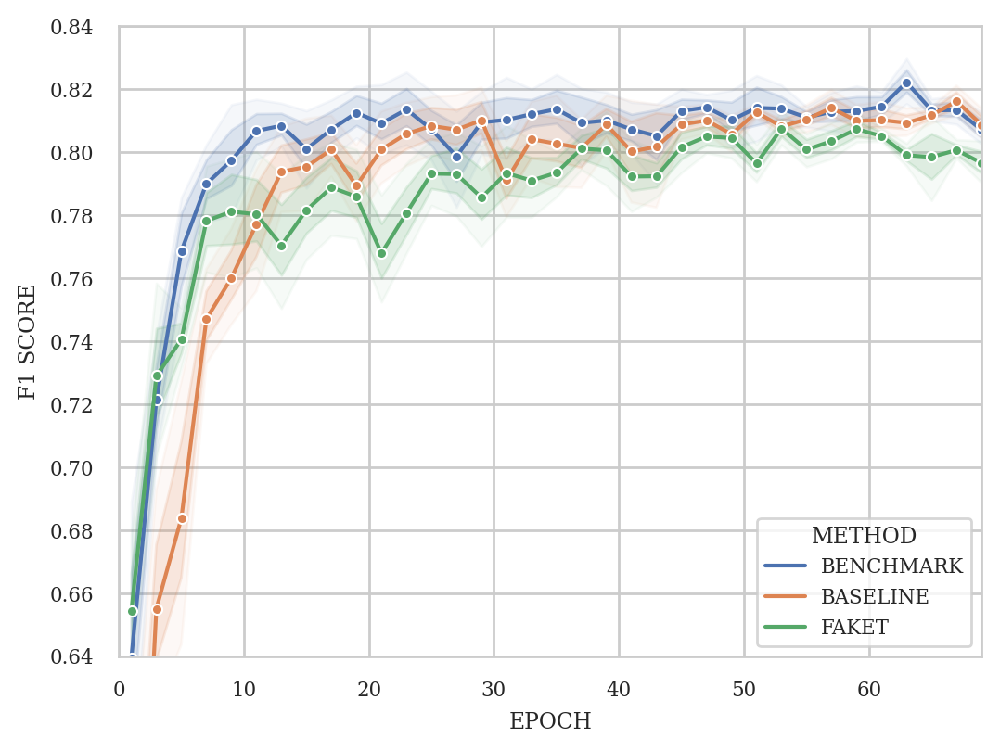

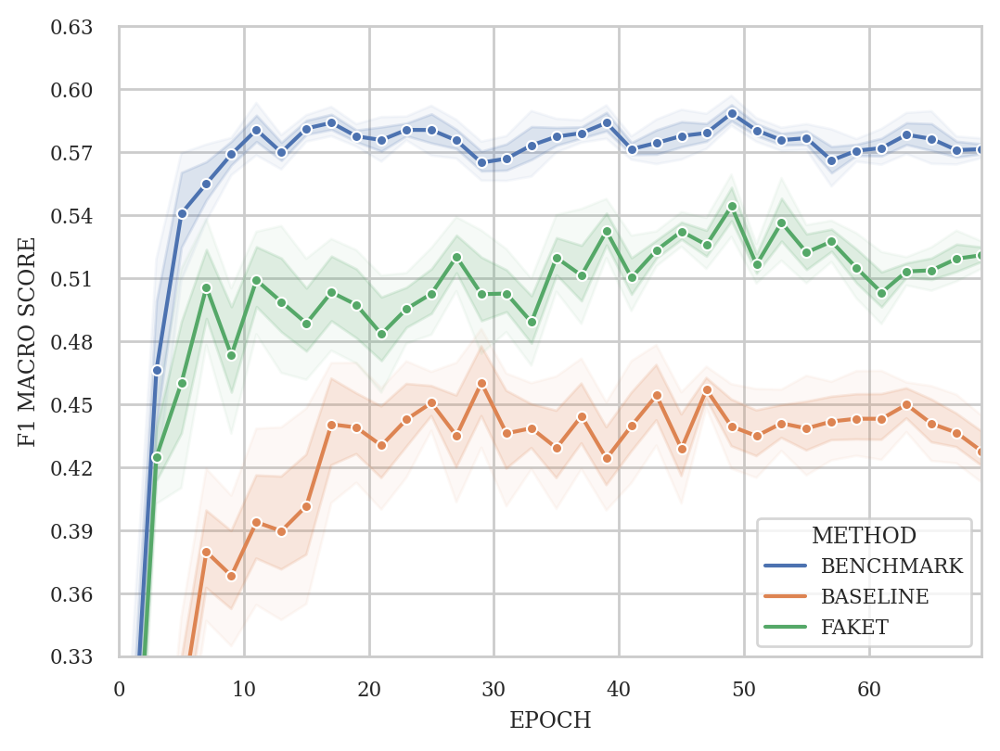

In [326]:
path = 'data/results'

# The following dict holds the map from folder_name to {method and report_file_name_template}
folder2method = {
    'exp_baseline': {'method': 'baseline', 'template': 'epoch{:03d}_2021_model_{}_{}_bin2_evaluation', 'path': path},
    'exp_gauss': {'method': 'gauss', 'template': 'epoch{:03d}_2021_model_{}_{}_bin2_evaluation', 'path': path},
    'exp_styled': {'method': 'styled', 'template': 'epoch{:03d}_2021_model_{}_{}_bin2_evaluation', 'path': path},
}

# List of the folders, seeds, epochs, and test_tomos to include in the figures
folders = list(folder2method.keys())
seeds = [f'seed{i+1}' for i in range(6)]
epochs = range(1, 71, 2)
test_tomo_indices = [9]
test_tomo_modalities = ['shrec']
df = get_dataframe(folders, folder2method, test_tomo_indices, test_tomo_modalities, epochs, seeds)

# Updating naming to match the paper
df.loc[df['METHOD'] == 'baseline', 'METHOD'] = naming['baseline']
df.loc[df['METHOD'] == 'gauss', 'METHOD'] = naming['gauss']
df.loc[df['METHOD'] == 'styled', 'METHOD'] = naming['styled']

# Performance on localization task (Figure 6)
fig = plot_method_comparison(df, task='localization', ylim_lo=0.64, ylim_hi=0.84, xticks=8, yticks=11, style=2, figsize=(6,4.5))
fig.savefig(pj(path, 'localization_results.pdf'), bbox_inches='tight')

# Performance on classification task (Figure 7)
fig = plot_method_comparison(df, task='classification', ylim_lo=0.33, ylim_hi=0.63, xticks=8, yticks=11, style=2, figsize=(6,4.5))
fig.savefig(pj(path, 'classification_results.pdf'), bbox_inches='tight')

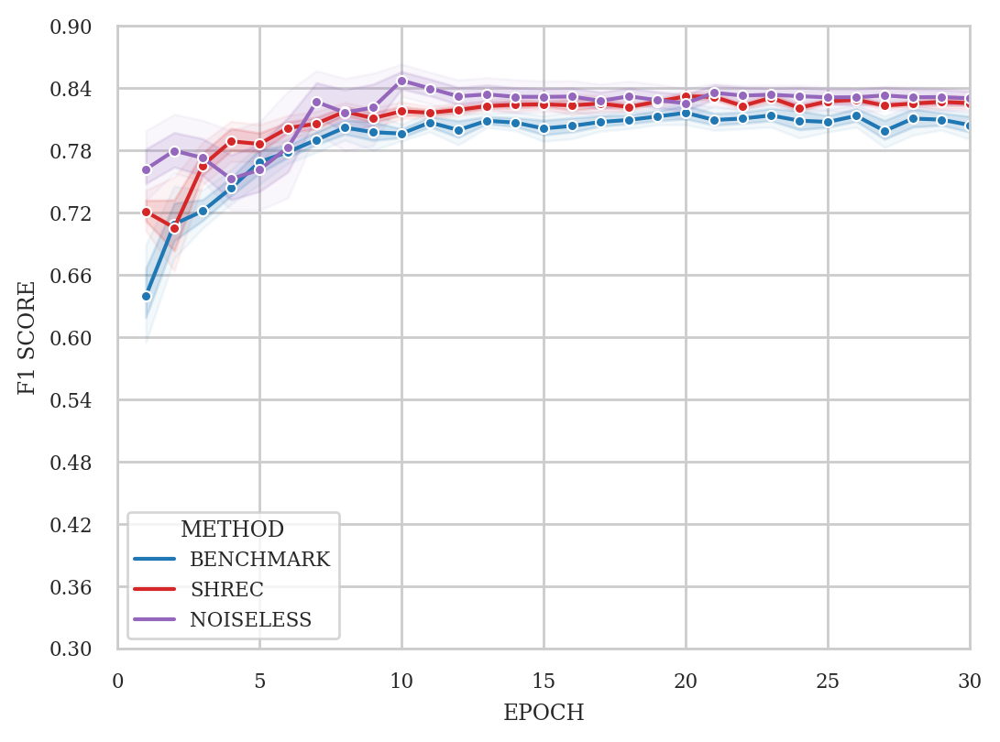

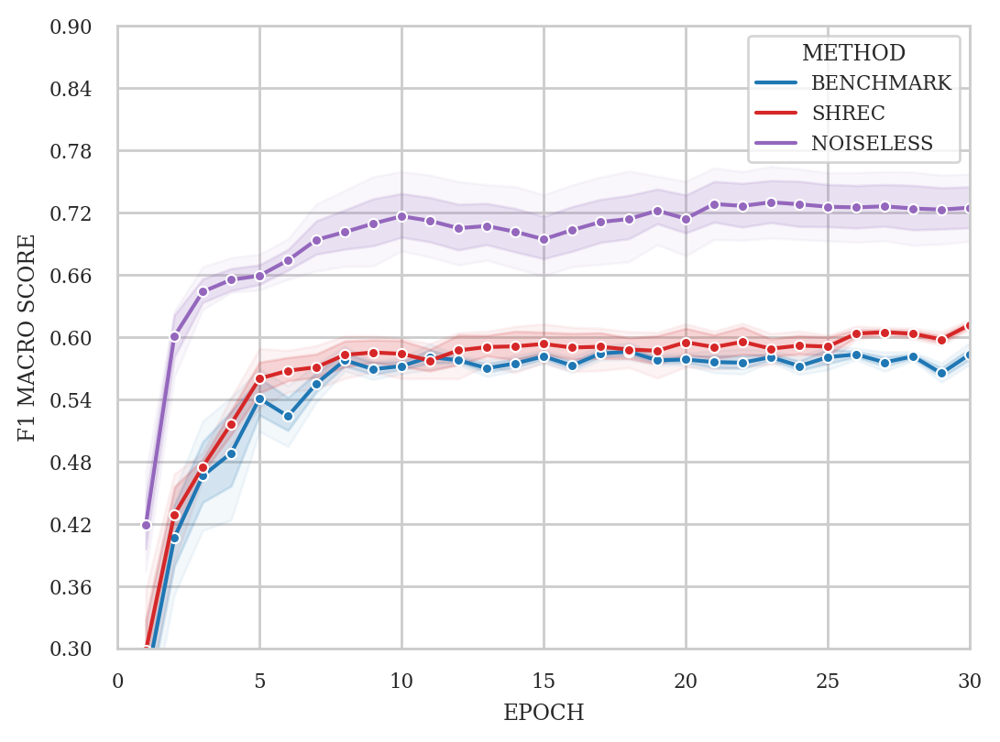

In [329]:
path = 'data/results'

folder2method = {
    'exp_baseline': {'method': 'baseline', 'template': 'epoch{:03d}_2021_model_{}_{}_bin2_evaluation', 'path': path},
    'exp_shrec': {'method': 'shrec', 'template': 'epoch{:03d}_2021_model_{}_{}_bin2_evaluation', 'path': path},
}

# List of the folders, seeds, epochs, and test_tomos to include in the figures
folders = list(folder2method.keys())
seeds = [f'seed{i+1}' for i in range(6)]
epochs = range(1, 31, 1)
test_tomo_indices = [9]
test_tomo_modalities = ['shrec']
df = get_dataframe(folders, folder2method, test_tomo_indices, test_tomo_modalities, epochs, seeds)

folder2method = {
    'exp_noiseless': {'method': 'noiseless', 'template': 'epoch{:03d}_2021_model_{}_{}_bin2_evaluation', 'path': path},
}

# List of the folders, seeds, epochs, and test_tomos to include in the figures
folders = list(folder2method.keys())
seeds = [f'seed{i+1}' for i in range(6)]
epochs = range(1, 31, 1)
test_tomo_indices = [9]
test_tomo_modalities = ['noiseless']
df = pd.concat([df, get_dataframe(folders, folder2method, test_tomo_indices, test_tomo_modalities, epochs, seeds)]).reset_index()

# Updating naming to match the paper
df.loc[df['METHOD'] == 'baseline', 'METHOD'] = naming['baseline']
df.loc[df['METHOD'] == 'shrec', 'METHOD'] = naming['shrec']
df.loc[df['METHOD'] == 'noiseless', 'METHOD'] = naming['noiseless']

# Performance on localization task (Figure 6)
fig = plot_method_comparison(df, task='localization', ylim_lo=0.3, ylim_hi=0.9, xticks=6, yticks=11, style=2, figsize=(6, 4.5), 
                             palette=np.array(sns.color_palette("tab10"))[[0,3,4]].tolist())
fig.savefig(pj(path, 'localization_results_compare.pdf'), bbox_inches='tight')

# Performance on classification task (Figure 7)
fig = plot_method_comparison(df, task='classification', ylim_lo=0.3, ylim_hi=0.9, xticks=6, yticks=11, style=2, figsize=(6, 4.5), 
                             palette=np.array(sns.color_palette("tab10"))[[0,3,4]].tolist())
fig.savefig(pj(path, 'classification_results_compare.pdf'), bbox_inches='tight')

## Show aggregated confusion matrices

for best epoch of each seed

In [330]:
# We added the first 0 into each array as this is the F1 score of background which
# is taken into account in the evaluation script. Therefore the numbers are all
# skewed by this number and in order for us to compare the results we need to evaluate
# them the same way, therefore, with the leading zero.

print('DF CLAIMED SCORES ON SHREC21')
print('Localization F1: 0.868')
# Not possible to reproduce exactly using publicly available code
DFO = [0.0, 0.402, 0.481, 0.517, 0.701, 0.716, 0.766, 0.737, 0.964, 0.989, 0.953, 0.974, 0.996, 1.000]
print(f'Clasification F1: {np.mean(DFO):.3f}')
print('\n')

print('PyTOM TM-T TEMPLATE MATCHING RESULTS ON SHREC21')
print('Localization F1: 0.372')
TMT = [0.0, 0.054, 0.197, 0.266, 0.302, 0.345, 0.452, 0.133, 0.615, 0.966, 0.545, 0.950, 0.857, 0.900]
print(f'Clasification F1: {np.mean(TMT):.3f}')
print('\n')

print('PyTOM TM-F TEMPLATE MATCHING RESULTS ON SHREC21')
print('Localization F1: 0.576')
TMF = [0.0, 0.040, 0.189, 0.200, 0.282, 0.308, 0.439, 0.129, 0.592, 0.962, 0.513, 0.827, 0.857, 0.900]
print(f'Clasification F1: {np.mean(TMF):.3f}')

DF CLAIMED SCORES ON SHREC21
Localization F1: 0.868
Clasification F1: 0.728


PyTOM TM-T TEMPLATE MATCHING RESULTS ON SHREC21
Localization F1: 0.372
Clasification F1: 0.470


PyTOM TM-F TEMPLATE MATCHING RESULTS ON SHREC21
Localization F1: 0.576
Clasification F1: 0.446


In [361]:
per_task = {'Localization F1': [], 'Classification F1': []}
index = []
per_class = {}
columns = ['1S3X', '3QM1', '3GL1', '3H84', '2CG9', '3D2F', '1U6G', '3CF3', '1BXN', '1QVR', '4CR2', '5MRC', 'fiducial']

### Model trained on `shrec` & tested on `shrec`

Localization F1: 0.821
Classification F1: 0.602
F1 per class:
['1S3X', '3QM1', '3GL1', '3H84', '2CG9', '3D2F', '1U6G', '3CF3', '1BXN', '1QVR', '4CR2', '5MRC', 'fiducial']
[0.1579, 0.1631, 0.2839, 0.5057, 0.4725, 0.6449, 0.5917, 0.9035, 0.9716, 0.9124, 0.9796, 0.9719, 0.8711]


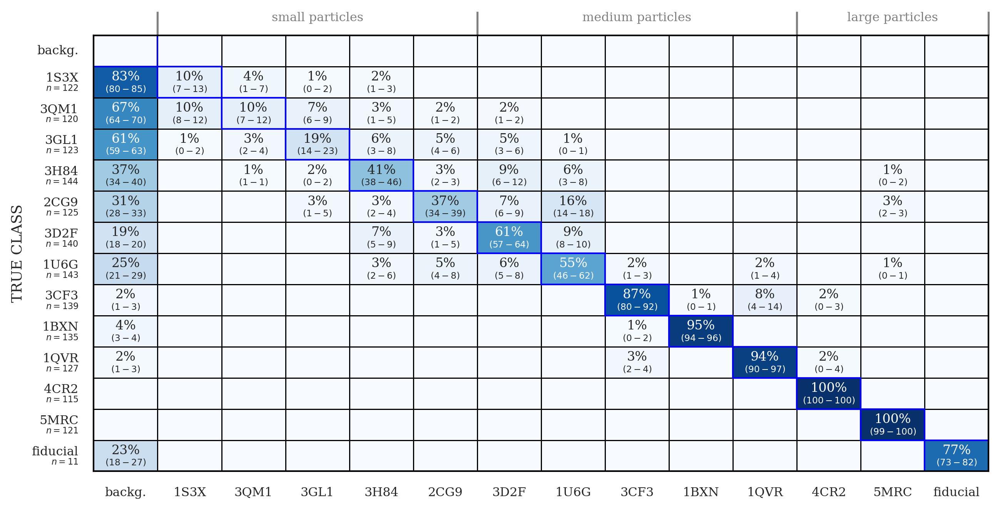

In [362]:
current = 'shrec'
path = 'data/results'

folder2method = {
    f'exp_{current}': {'method': current, 'template': 'epoch{:03d}_2021_model_{}_{}_bin2_evaluation', 'path': path},
}

# List of the folders, seeds, epochs, and test_tomos to include in the figures
folders = list(folder2method.keys())
seeds = [f'seed{i+1}' for i in range(6)]
epochs = range(1, 71, 1)
test_tomo_indices = [9]
test_tomo_modalities = ['shrec']
df = get_dataframe(folders, folder2method, test_tomo_indices, test_tomo_modalities, epochs, seeds)

# Updating naming to match the paper
df.loc[df['METHOD'] == current, 'METHOD'] = naming[current]

df = df.loc[(df['METHOD'] == naming[current]) & (df['TEST_TOMO_MODALITY'] == 'shrec') & (df['VAL BEST EPOCH'])]
df.to_csv(pj(path, f'best_epochs_{naming[current]}.csv'), index=False)

stack_confusion_matrices(df, normalized=True, figsize=(10, 5))
plt.savefig(pj(path, f'confmat_{naming[current]}.pdf'), bbox_inches='tight')

per_class[naming[current]] = df[columns].mean()
index.append(naming[current])
per_task['Localization F1'].append(df['F1 SCORE'].mean())
per_task['Classification F1'].append(df['F1 MACRO SCORE'].mean())

print(f"Localization F1: {df['F1 SCORE'].mean():.3f}")
print(f"Classification F1: {df['F1 MACRO SCORE'].mean():.3f}")
print(f'F1 per class:\n{list(per_class[naming[current]].index)}\n{list(np.round(per_class[naming[current]].values, 4))}')

### Model trained on `baseline` & tested on `shrec`

Localization F1: 0.815
Classification F1: 0.581
F1 per class:
['1S3X', '3QM1', '3GL1', '3H84', '2CG9', '3D2F', '1U6G', '3CF3', '1BXN', '1QVR', '4CR2', '5MRC', 'fiducial']
[0.1073, 0.2365, 0.2522, 0.4641, 0.4719, 0.5897, 0.5322, 0.8896, 0.9665, 0.8342, 0.9476, 0.9662, 0.8711]


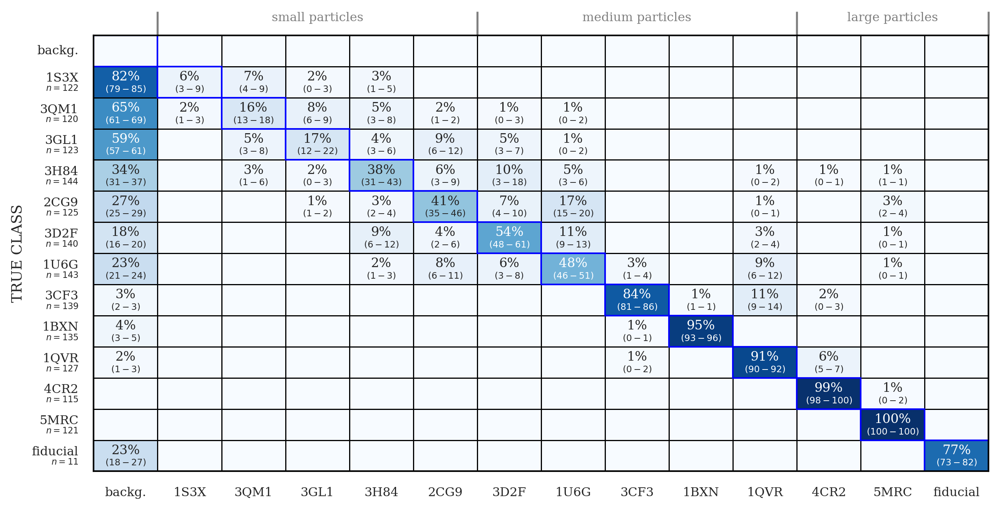

In [363]:
current = 'baseline'
path = 'data/results'

folder2method = {
    f'exp_{current}': {'method': current, 'template': 'epoch{:03d}_2021_model_{}_{}_bin2_evaluation', 'path': path},
}

# List of the folders, seeds, epochs, and test_tomos to include in the figures
folders = list(folder2method.keys())
seeds = [f'seed{i+1}' for i in range(6)]
epochs = range(1, 71, 1)
test_tomo_indices = [9]
test_tomo_modalities = ['shrec']
df = get_dataframe(folders, folder2method, test_tomo_indices, test_tomo_modalities, epochs, seeds)

# Updating naming to match the paper
df.loc[df['METHOD'] == current, 'METHOD'] = naming[current]

df = df.loc[(df['METHOD'] == naming[current]) & (df['TEST_TOMO_MODALITY'] == 'shrec') & (df['VAL BEST EPOCH'])]
df.to_csv(pj(path, f'best_epochs_{naming[current]}.csv'), index=False)

stack_confusion_matrices(df, normalized=True, figsize=(10, 5))
plt.savefig(pj(path, f'confmat_{naming[current]}.pdf'), bbox_inches='tight')
            
per_class[naming[current]] = df[columns].mean()
index.append(naming[current])
per_task['Localization F1'].append(df['F1 SCORE'].mean())
per_task['Classification F1'].append(df['F1 MACRO SCORE'].mean())

print(f"Localization F1: {df['F1 SCORE'].mean():.3f}")
print(f"Classification F1: {df['F1 MACRO SCORE'].mean():.3f}")
print(f'F1 per class:\n{list(per_class[naming[current]].index)}\n{list(np.round(per_class[naming[current]].values, 4))}')

### Model trained on `styled` & tested on `shrec`

Localization F1: 0.800
Classification F1: 0.533
F1 per class:
['1S3X', '3QM1', '3GL1', '3H84', '2CG9', '3D2F', '1U6G', '3CF3', '1BXN', '1QVR', '4CR2', '5MRC', 'fiducial']
[0.1678, 0.1618, 0.226, 0.4585, 0.3961, 0.5819, 0.4659, 0.7871, 0.9181, 0.813, 0.7978, 0.8235, 0.8614]


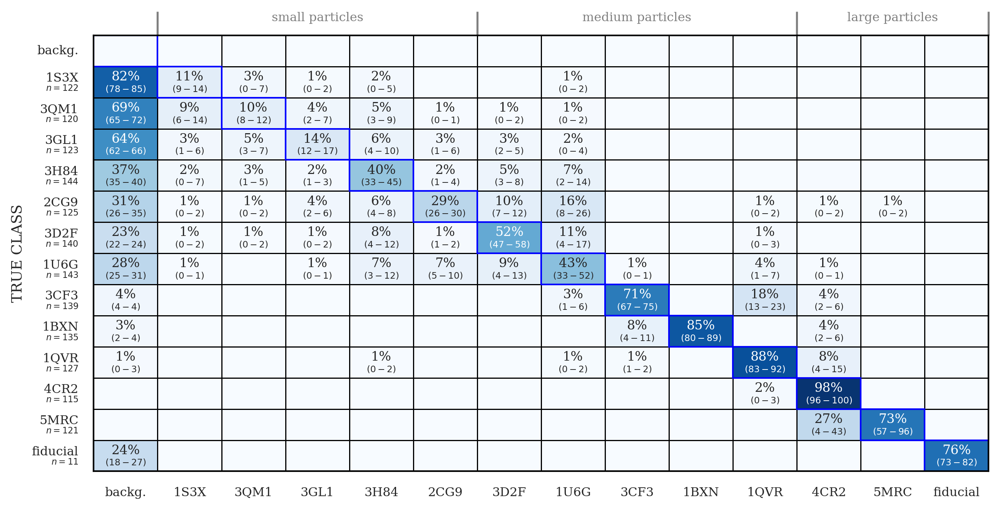

In [364]:
current = 'styled'
path = 'data/results'

folder2method = {
    f'exp_{current}': {'method': current, 'template': 'epoch{:03d}_2021_model_{}_{}_bin2_evaluation', 'path': path},
}

# List of the folders, seeds, epochs, and test_tomos to include in the figures
folders = list(folder2method.keys())
seeds = [f'seed{i+1}' for i in range(6)]
epochs = range(1, 71, 1)
test_tomo_indices = [9]
test_tomo_modalities = ['shrec']
df = get_dataframe(folders, folder2method, test_tomo_indices, test_tomo_modalities, epochs, seeds)

# Updating naming to match the paper
df.loc[df['METHOD'] == current, 'METHOD'] = naming[current]

df = df.loc[(df['METHOD'] == naming[current]) & (df['TEST_TOMO_MODALITY'] == 'shrec') & (df['VAL BEST EPOCH'])]
df.to_csv(pj(path, f'best_epochs_{naming[current]}.csv'), index=False)

stack_confusion_matrices(df, normalized=True, figsize=(10, 5))
plt.savefig(pj(path, f'confmat_{naming[current]}.pdf'), bbox_inches='tight')
            
per_class[naming[current]] = df[columns].mean()
index.append(naming[current])
per_task['Localization F1'].append(df['F1 SCORE'].mean())
per_task['Classification F1'].append(df['F1 MACRO SCORE'].mean())

print(f"Localization F1: {df['F1 SCORE'].mean():.3f}")
print(f"Classification F1: {df['F1 MACRO SCORE'].mean():.3f}")
print(f'F1 per class:\n{list(per_class[naming[current]].index)}\n{list(np.round(per_class[naming[current]].values, 4))}')

### Model trained on `gauss` & tested on `shrec`

Localization F1: 0.813
Classification F1: 0.441
F1 per class:
['1S3X', '3QM1', '3GL1', '3H84', '2CG9', '3D2F', '1U6G', '3CF3', '1BXN', '1QVR', '4CR2', '5MRC', 'fiducial']
[0.0309, 0.1991, 0.2492, 0.353, 0.4225, 0.5058, 0.2423, 0.7062, 0.9179, 0.7545, 0.6407, 0.4891, 0.6681]


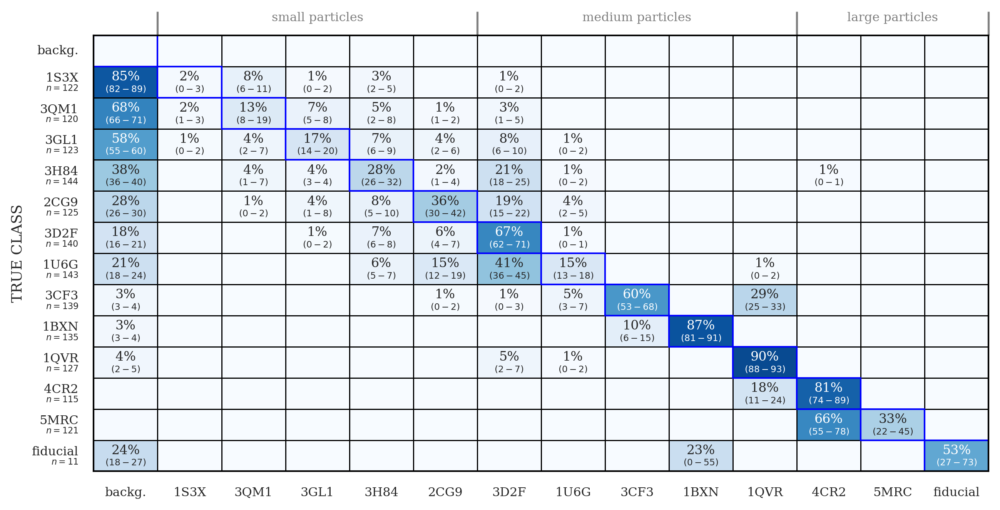

In [365]:
current = 'gauss'
path = 'data/results'

folder2method = {
    f'exp_{current}': {'method': current, 'template': 'epoch{:03d}_2021_model_{}_{}_bin2_evaluation', 'path': path},
}

# List of the folders, seeds, epochs, and test_tomos to include in the figures
folders = list(folder2method.keys())
seeds = [f'seed{i+1}' for i in range(6)]
epochs = range(1, 71, 1)
test_tomo_indices = [9]
test_tomo_modalities = ['shrec']
df = get_dataframe(folders, folder2method, test_tomo_indices, test_tomo_modalities, epochs, seeds)

# Updating naming to match the paper
df.loc[df['METHOD'] == current, 'METHOD'] = naming[current]

df = df.loc[(df['METHOD'] == naming[current]) & (df['TEST_TOMO_MODALITY'] == 'shrec') & (df['VAL BEST EPOCH'])]
df.to_csv(pj(path, f'best_epochs_{naming[current]}.csv'), index=False)

stack_confusion_matrices(df, normalized=True, figsize=(10, 5))
plt.savefig(pj(path, f'confmat_{naming[current]}.pdf'), bbox_inches='tight')
            
per_class[naming[current]] = df[columns].mean()
index.append(naming[current])
per_task['Localization F1'].append(df['F1 SCORE'].mean())
per_task['Classification F1'].append(df['F1 MACRO SCORE'].mean())

print(f"Localization F1: {df['F1 SCORE'].mean():.3f}")
print(f"Classification F1: {df['F1 MACRO SCORE'].mean():.3f}")
print(f'F1 per class:\n{list(per_class[naming[current]].index)}\n{list(np.round(per_class[naming[current]].values, 4))}')

In [374]:
per_task = pd.DataFrame(per_task, index=index)
per_task

,Localization F1,Classification F1
SHREC,0.821163,0.602115
BENCHMARK,0.815397,0.580654
FAKET,0.799518,0.532781
BASELINE,0.813266,0.441372


In [376]:
per_class = pd.DataFrame(per_class)
per_class

,SHREC,BENCHMARK,FAKET,BASELINE
1S3X,0.157870,0.107329,0.167764,0.030901
3QM1,0.163060,0.236530,0.161847,0.199092
3GL1,0.283920,0.252198,0.226012,0.249184
3H84,0.505665,0.464066,0.458500,0.352990
2CG9,0.472473,0.471900,0.396108,0.422504
3D2F,0.644879,0.589659,0.581934,0.505840
1U6G,0.591714,0.532203,0.465915,0.242329
3CF3,0.903494,0.889634,0.787080,0.706181
1BXN,0.971631,0.966537,0.918054,0.917871
1QVR,0.912364,0.834153,0.813048,0.754468


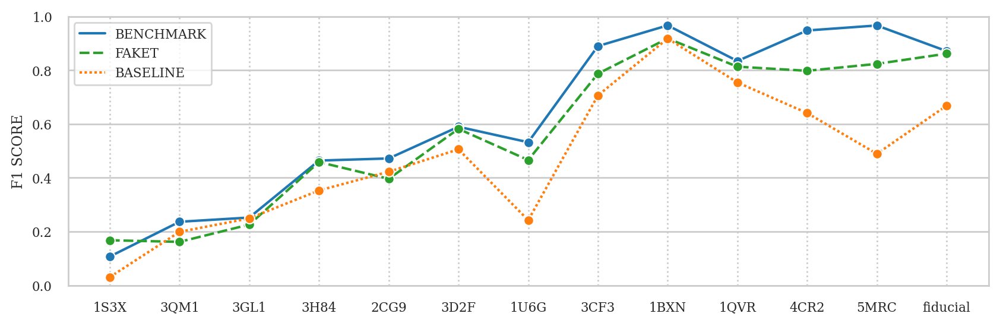

In [418]:
import seaborn as sns
per_class = pd.DataFrame(per_class)[[naming['baseline'], naming['styled'], naming['gauss']]]
plt.figure(figsize=(10, 3), dpi=200)
sns.set_style(['dark', 'white', 'whitegrid', 'darkgrid', 'ticks'][2])
plt.rcParams['font.family'] = 'serif'
ax = sns.lineplot(data=per_class, marker='o', palette=np.array(sns.color_palette("tab10"))[[0,2,1]].tolist())
plt.ylim(0, 1)
plt.ylabel('F1 SCORE')
ax.grid(visible=False, axis='both')
ax.grid(visible=True, axis='y')
ax.grid(visible=True, axis='x', linestyle=':')
plt.savefig(pj(path, f'per_class.pdf'), bbox_inches='tight')

# Creating the figures for the paper

In [386]:
N = 0  # Tomogram to visualize
# plt.rcParams['grid.color'] = (1.0, 1.0, 1.0, 0.01)
sns.set_style(['dark', 'white', 'whitegrid', 'darkgrid', 'ticks'][1])
plt.rcParams['axes.grid'] = False
# plt.grid(visible=None)

## Plotting projections

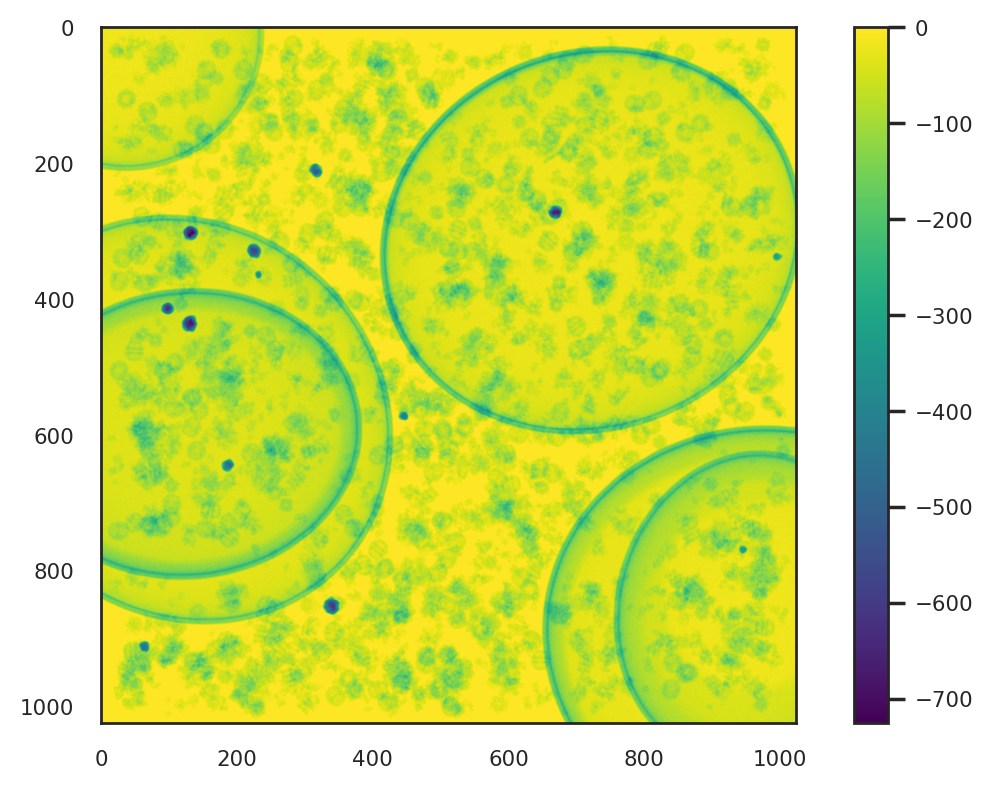

In [342]:
# Noiseless projection
plot_tilt(load_mrc(pj(data_folder, f'model_{N}', 'faket', 'projections_noiseless.mrc')))
plt.savefig(pj(path, f'projections_{naming["noiseless"]}.pdf'), bbox_inches='tight')

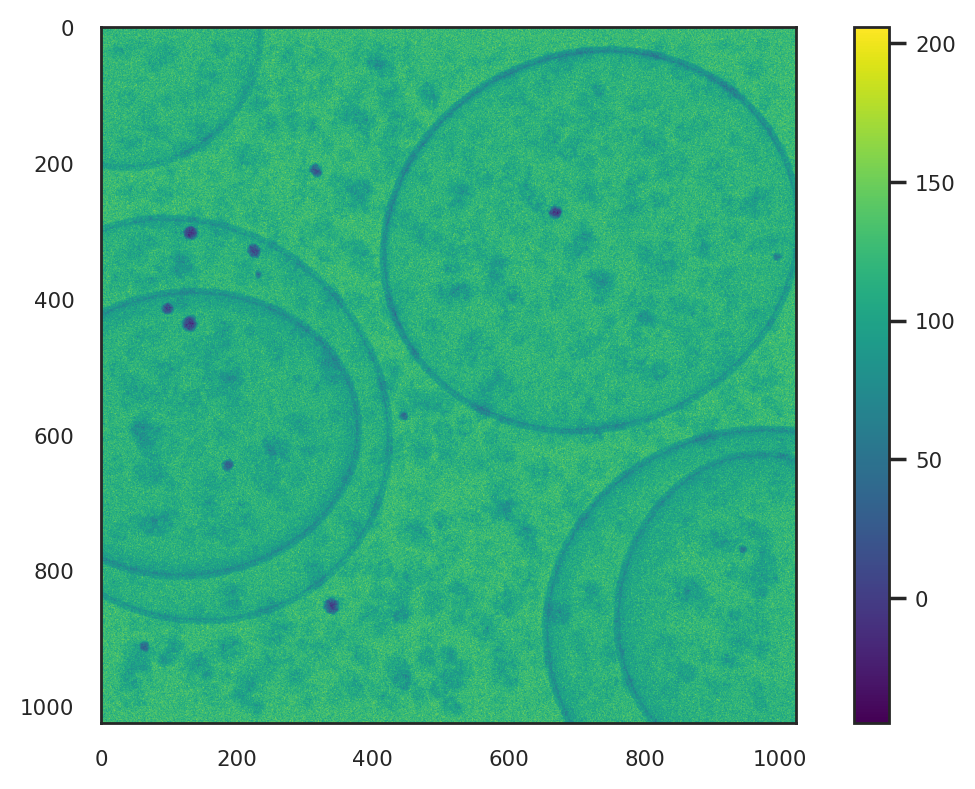

In [343]:
# Content projection
plot_tilt(load_mrc(pj(data_folder, f'model_{N}', 'faket', 'projections_content.mrc')))
plt.savefig(pj(path, f'projections_CONTENT.pdf'), bbox_inches='tight')

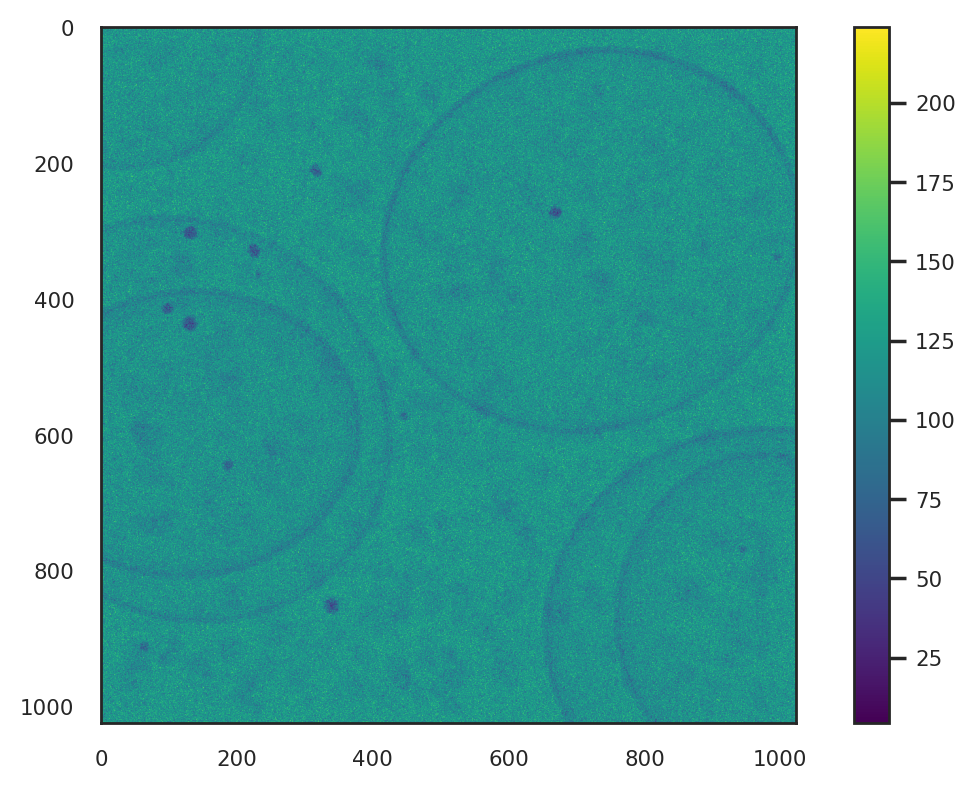

In [344]:
# Gauss projection
plot_tilt(load_mrc(pj(data_folder, f'model_{N}', 'faket', 'projections_gauss.mrc')))
plt.savefig(pj(path, f'projections_{naming["gauss"]}.pdf'), bbox_inches='tight')

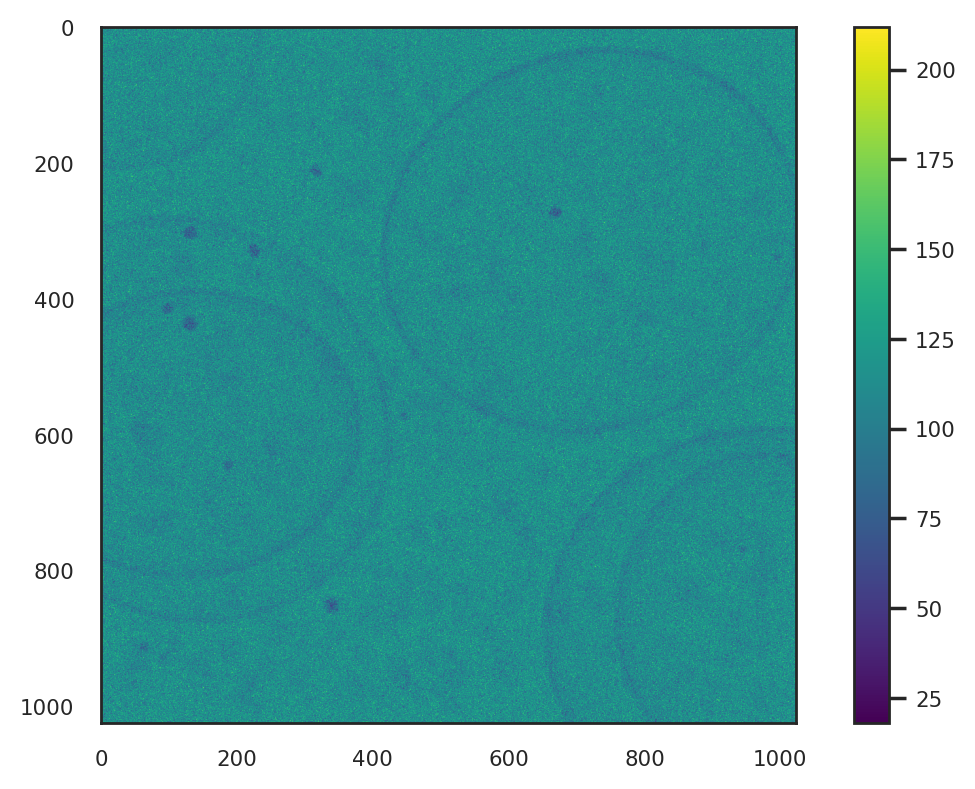

In [345]:
# Noisy projection
plot_tilt(load_mrc(pj(data_folder, f'model_{N}', 'faket', 'projections_noisy.mrc')))
plt.savefig(pj(path, f'projections_NOISY.pdf'), bbox_inches='tight')

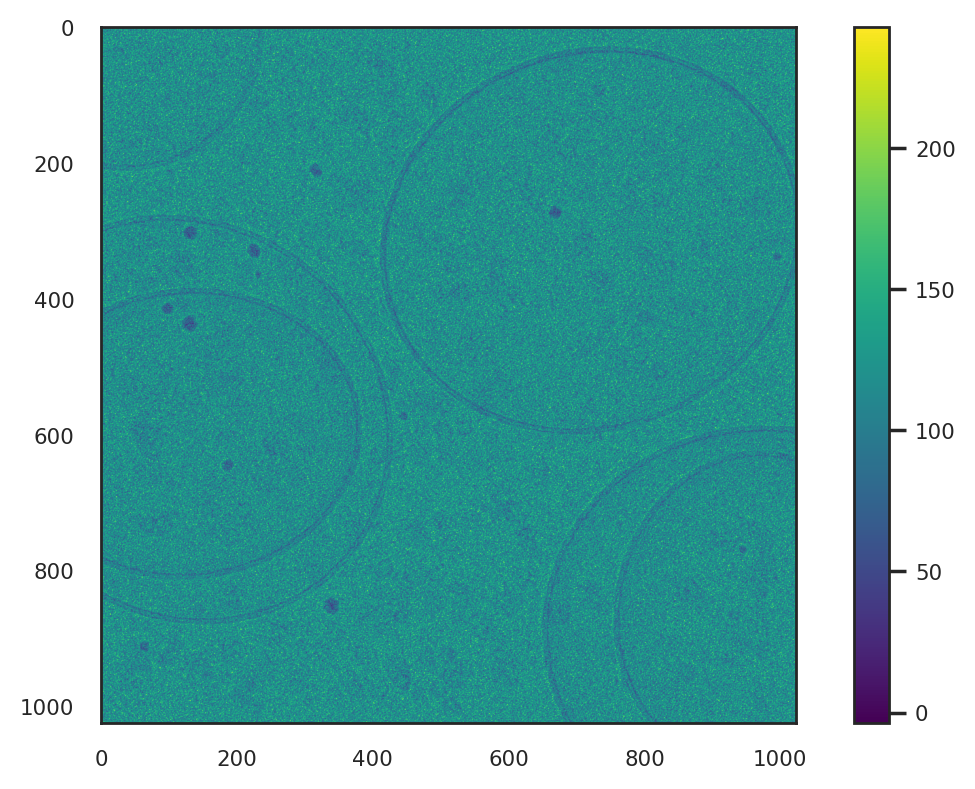

In [346]:
# Styled projection
plot_tilt(load_mrc(pj(data_folder, f'model_{N}', 'faket', 'projections_styled.mrc')))
plt.savefig(pj(path, f'projections_{naming["styled"]}.pdf'), bbox_inches='tight')

/home/hararp75/.conda/envs/faket/lib/python3.9/site-packages/mrcfile/mrcinterpreter.py:209: RuntimeWarning: Map ID string not found - not an MRC file, or file is corrupt
  warnings.warn(msg, RuntimeWarning)


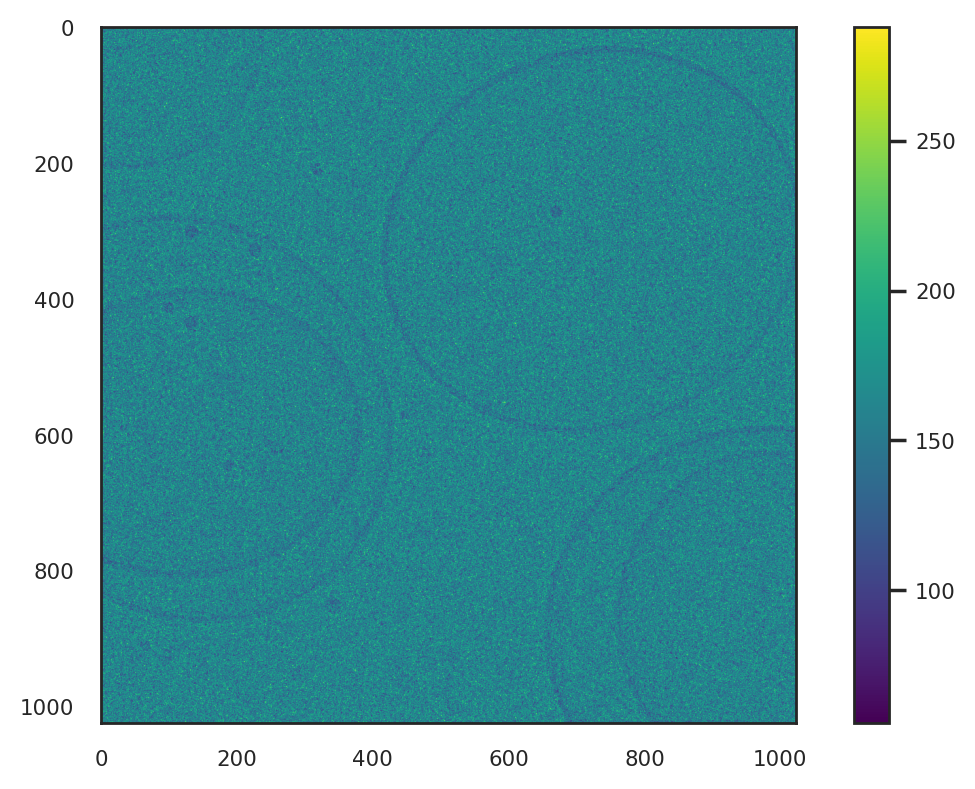

In [347]:
# Desired projections by SHREC21
plot_tilt(load_mrc(pj(data_folder, f'model_{N}', 'projections_unbinned.mrc')))
plt.savefig(pj(path, f'projections_{naming["shrec"]}.pdf'), bbox_inches='tight')

/home/hararp75/.conda/envs/faket/lib/python3.9/site-packages/mrcfile/mrcinterpreter.py:209: RuntimeWarning: Map ID string not found - not an MRC file, or file is corrupt
  warnings.warn(msg, RuntimeWarning)


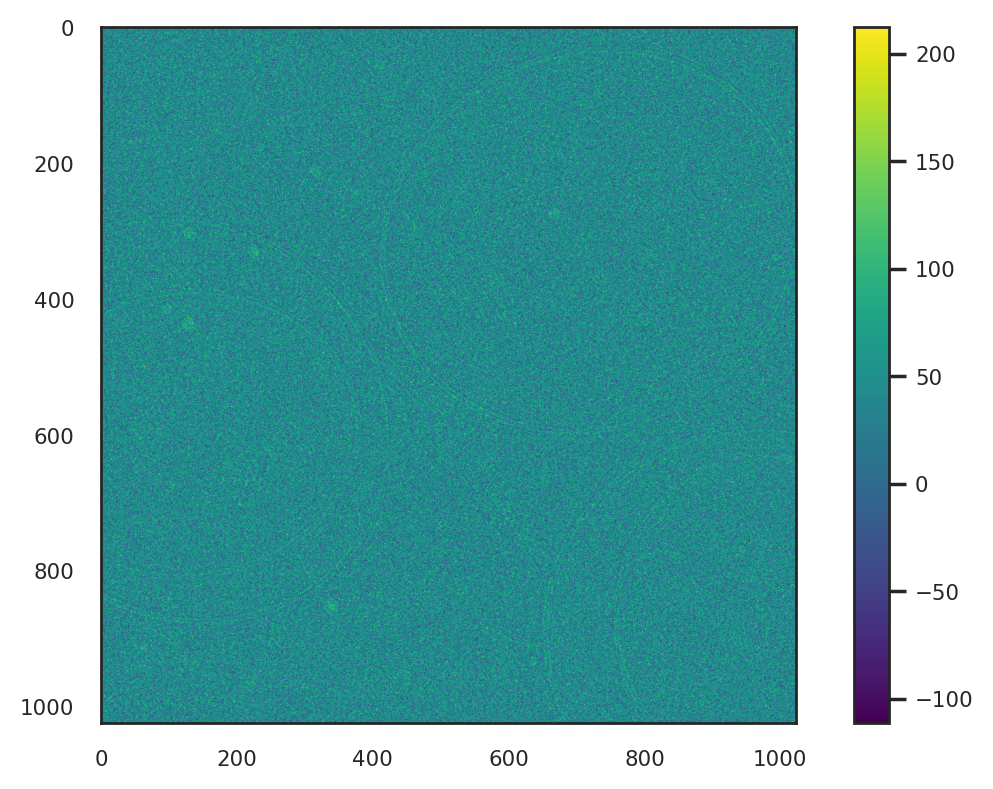

In [348]:
# The difference between SHREC and our simulated projections
diff = load_mrc(pj(data_folder, f'model_{N}', 'projections_unbinned.mrc')) - \
    load_mrc(pj(data_folder, f'model_{N}', 'faket', 'projections_styled.mrc'))

plot_tilt(diff)
plt.savefig(pj(path, f'projections_{naming["shrec"]}-{naming["styled"]}.pdf'), bbox_inches='tight')

## Plotting reconstructions to compare filtering

In [396]:
# Standardizing and plotting in a common clim to make the plots comparable
rec_shrec = standardize(load_mrc(pj(data_folder, f'model_{N}', 'faket', 'reconstruction_shrec.mrc')))
rec_baseline = standardize(load_mrc(pj(data_folder, f'model_{N}', 'faket', 'reconstruction_baseline.mrc')))
lo = min(rec_shrec[90].min(), rec_baseline[90].min())
hi = max(rec_shrec[90].max(), rec_baseline[90].max())

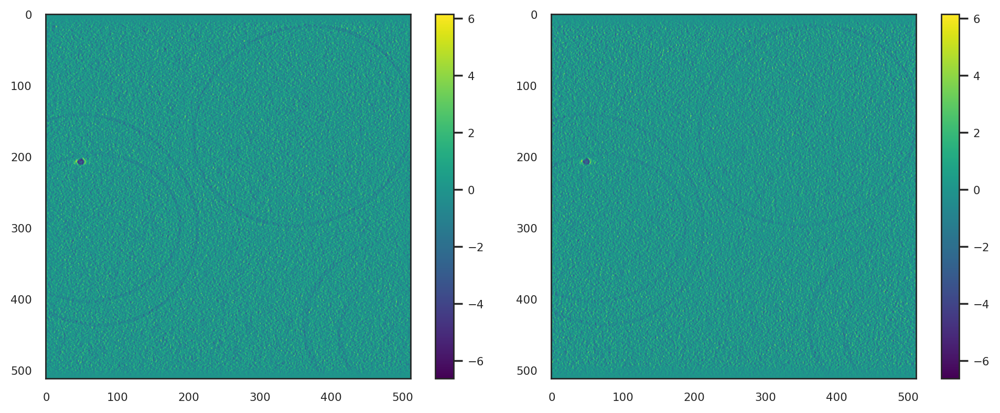

In [415]:
plt.figure(figsize=(10, 4.), dpi=200)
plt.subplot(121)
plot_tilt(rec_shrec, clim=(lo, hi), fig=False)
plt.subplot(122)
plot_tilt(rec_baseline, clim=(lo, hi), fig=False)
plt.savefig(pj(path, f'middle-z-slice-real_{naming["shrec"]}_{naming["baseline"]}.pdf'), bbox_inches='tight')

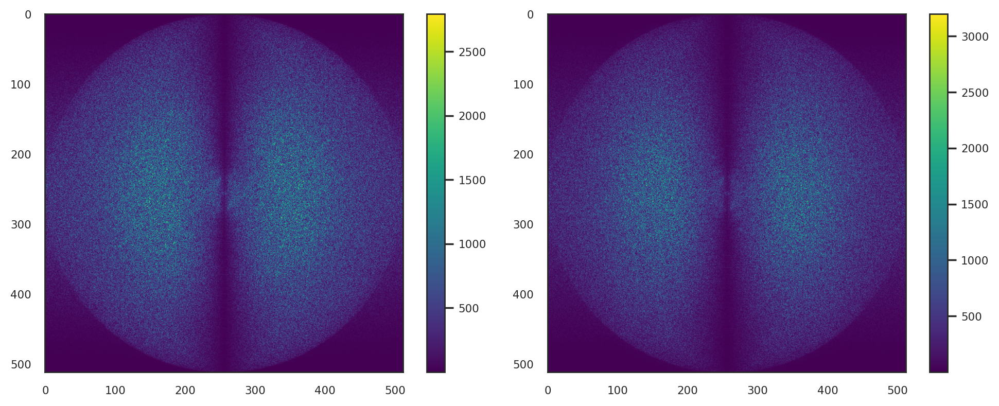

In [414]:
plt.figure(figsize=(10, 4.), dpi=200)
plt.subplot(121)
plot_tilt(np.array([np.fft.fftshift(np.abs(np.fft.fftn(rec_shrec[90])))]), tilt=0, fig=False)
plt.subplot(122)
plot_tilt(np.array([np.fft.fftshift(np.abs(np.fft.fftn(rec_baseline[90])))]), tilt=0, fig=False)
plt.savefig(pj(path, f'middle-z-slice-fourier_{naming["shrec"]}_{naming["baseline"]}.pdf'), bbox_inches='tight')